# Lab 10 Images - Exercises

These are some imports. You can skip this part.

In [51]:
%matplotlib inline
import math
from IPython.display import display, HTML
from skimage import data, io, filters, exposure
from skimage import util
from skimage.color import rgb2hsv, hsv2rgb, rgb2gray
from skimage.filters import gabor_kernel
from skimage.measure import moments, moments_central, moments_normalized, moments_hu
import numpy as np
from skimage.transform import resize
from scipy.stats import kurtosis
from scipy.stats import skew
from scipy.signal import fftconvolve
from scipy.ndimage import center_of_mass
from scipy import spatial
from pylab import *
import random

The LabImage class is used in this notebook to keep a data of an image. It contains the following fields:<br>
a) img : an image object (numpy array),<br>
b) ID : name of a file,<br>
c) featuresValues: a feature vector. Each value of the feature vector corresponds to one predefined feature (characteristic/property of the image).<br>

In [52]:
class LabImage:
    def __init__(self, img, ID):
        self.img = img # image object - numpy array
        self.ID = str(ID) # name of a file
        self.featuresValues = [] # each feature in a vector corresponds to one
        # characteristic of the image

The class Exercise maintains all data and provides methods for: 
* loading images, 
* displaying images and their characteristics,
* searching for the most similar images of the collection to the provided query (image). 
You do not need to read the code.
 
During the following exercises, you will be asked to implement (override) only two methods: 
* functionOfSImilarity (it computes a similarity between two provided feature vectors) 
* featuresExtractor (it constructs a feature vector). 

In [53]:
class Exercise:
    # Exercise("exercise1/intro/", featuresNames_MeanColors, featuresExtractor_MeanColors)
    def __init__(self, folderPath, featuresNames = None, featuresExtractor = None):
        self.images = []
        self.featuresNames = []
        self.featuresExtractor = featuresExtractor
        self.loadAndCompute(folderPath, featuresNames, featuresExtractor)
        self.folderPath = folderPath
        
    # loading images
    def loadAndCompute(self, folderPath, featuresNames = None, featuresExtractor = None):
      
        collection = io.imread_collection(folderPath + "*.jpg")
        self.images = [LabImage(collection[i], collection.files[i]) for i in range(0, len(collection))]
       
        if featuresNames is not None:
            self.featuresNames = featuresNames
        if featuresExtractor is not None:
            for image in self.images:
                image.featuresValues = featuresExtractor(image.img)
                
    # searching for the most similar images of the collection to the provided query
    def searchForImage(self, folderPath, fileName, functionOfSImilarity, scale = 1.0,):
        queryImage = LabImage(io.imread(folderPath + fileName), fileName)
        queryImage.featuresValues = self.featuresExtractor(queryImage.img)
        orderedIDs = [i for i in range(0, len(self.images))]
        similarities = [functionOfSImilarity(queryImage.featuresValues, image.featuresValues) 
                        for image in self.images]
        
        tmp = list(zip(orderedIDs, similarities))
        tmp.sort(key = lambda x: x[1], reverse = True)
        orderedIDs, similarities = zip(*tmp)
        ### DISPLAY QUERY
        figure(figsize=(5.0 * scale, 5.0 * scale), dpi=80)
        subplot(1, 1, 1); plt.imshow(queryImage.img)
        plt.show()
        print(queryImage.ID)
        #features 
        data = []
        for j in range(0, len(self.featuresNames)):
            if isinstance(queryImage.featuresValues, np.ndarray): 
                fV = []
                fV.append("- "+ self.featuresNames[j])
                fV.append("NaN")
                data.append(fV)
            else:
                fV = []
                fV.append("- "+ self.featuresNames[j])
                fV.append("{:10.2f}".format(queryImage.featuresValues[j]))
                data.append(fV)
        
        col_width = max(len(word) for row in data for word in row) + 5 # PADDING
        for row in data:
            print("".join(word.ljust(col_width) for word in row))
        ### DISPLAY RESULTS
        self.display(scale = scale, orderedIDs = orderedIDs, similarities = similarities)
    
    def printStats(self, lIMG, rIMG, orderedIDs = [], similarities = []):
        data = []
        # names
        names = []
        for i in range(lIMG, rIMG):
            names.append(self.images[orderedIDs[i]].ID[len(self.folderPath):])
            names.append(" ")
        data.append(names)
        # similarities
        if len(similarities) > 0:
            sim = []
            for i in range(lIMG, rIMG):
                sim.append("Similarity")
                sim.append("{:10.2f}".format(similarities[i]))
            data.append(sim)
        #features 
        for j in range(0, len(self.featuresNames)):
            if isinstance(self.images[orderedIDs[i]].featuresValues, np.ndarray):
                fV = []
                for i in range(lIMG, rIMG):
                    fV.append("- "+ self.featuresNames[j])
                    fV.append("NaN")
                data.append(fV)         
            else:
                fV = []
                for i in range(lIMG, rIMG):
                    fV.append("- "+ self.featuresNames[j])
                    fV.append("{:10.2f}".format(self.images[orderedIDs[i]].featuresValues[j]))
                data.append(fV)
        
        col_width = max(len(word) for row in data for word in row) + 5 # PADDING
        for row in data:
            print("".join(word.ljust(col_width) for word in row))
            
    def display(self, scale = 1.0, orderedIDs = [], similarities = []):
        div = 3
        h = (len(self.images))/div
        if len(orderedIDs) == 0:
            orderedIDs = [i for i in range(0, len(self.images))]
        for i in range(0, math.ceil(h)):
            figure(figsize=(14.0 * scale, 5.0 * scale), dpi=80)
            idx = i * div
            for j in range(0, div):
                if (idx + j < len(self.images)):
                    subplot(2, div, j + 1); plt.imshow(self.images[orderedIDs[idx + j]].img)
            plt.show()
            end = min([len(self.images), i * div + div])
            self.printStats(i * div, end, orderedIDs = orderedIDs, similarities = similarities)

# Exercise 1: Color Moments + Similarity

1.1) Color moments are measures which inform about a distribution of values of a particular color (e.g., blue) in an image. In the following, you are asked to implement the first three color moments (but, obviously, there are more). The first color moment is a mean value of a color. 
<br><br>
Read the below code. Firstly, names of the features are defined (featuresNames_MeanColors). In this exercise you are asked to compute mean values of Red, Green, and Blue (RGB) colors (channels) of the images contained in "exercise1/intro" folder. For this purpose, complete the featuresExtractor_MeanColors method (as you may notice, featuresExtractor_MeanColors and featuresNames_MeanColors objects are passed to the constructor of the Exercise object) so that the method returns a 3-element feature vector which contains mean values of each color (red, green, blue; use np.mean()). Then, run the script and analyse the results:<br><br>
 

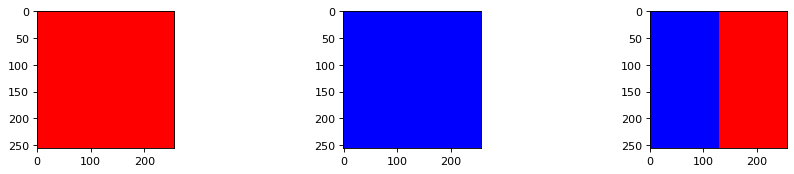

1.jpg                             2.jpg                             3.jpg                             
- red mean           255.00       - red mean             0.00       - red mean           127.50       
- green mean           0.00       - green mean           0.00       - green mean           0.00       
- blue mean            0.00       - blue mean          255.00       - blue mean          127.50       


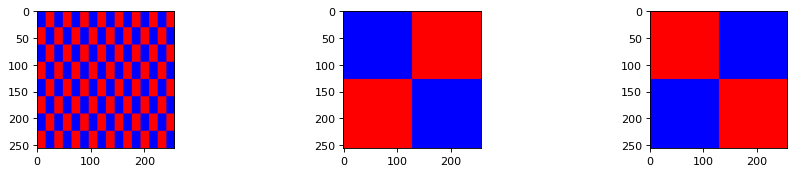

4.jpg                             5.jpg                             6.jpg                             
- red mean           127.50       - red mean           127.50       - red mean           127.50       
- green mean           0.00       - green mean           0.00       - green mean           0.00       
- blue mean          127.50       - blue mean          127.50       - blue mean          127.50       


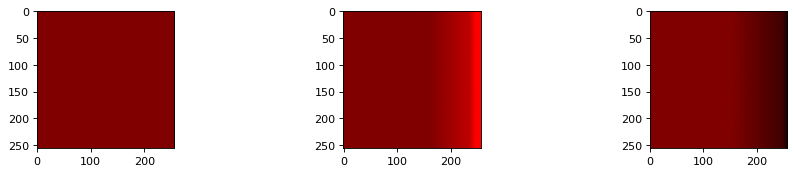

7.jpg                             8.jpg                             9.jpg                             
- red mean           128.00       - red mean           146.12       - red mean           112.66       
- green mean           0.00       - green mean           0.09       - green mean           0.09       
- blue mean            0.00       - blue mean            0.05       - blue mean            0.11       


In [123]:
featuresNames_MeanColors = ["red mean", "green mean", "blue mean"]

# Compute mean values of Red, Green, Blue colors of the images contained in "exercise1/intro"
def featuresExtractor_MeanColors(image):

    # returns a 3-element feature vector which contains mean values of each color
    values = [np.mean(image[:,:,0]),np.mean(image[:,:,1]),np.mean(image[:,:,2])]
    return values
    
e1 = Exercise("images/exercise1/intro/", featuresNames_MeanColors, featuresExtractor_MeanColors)
e1.display(scale = 1.0)

Questions:  
i) What is the difference between the feature vector of the image 1.jpg and the feature vector of the image 2.jpg?<br>

    Feature vector <Red mean, Green mean, Blue mean> of 1.jpg: <255.00, 0.00, 0.00>. Feature vector of 2.jpg: <0.00, 0.00, 255.00>. First image is red and the second one is blue.


ii) Why are all the feature vectors of the images 3.jpg-6.jpg the same? <br>

    Feature vectors of the images 3.jpg - 6.jpg are the same: <127.50,  0.00, 127.50>, because in each of these pictures there is the same amount of red and blue.

iii) Considering images 7.jpg-9.jpg, why is the mean of the red color the smallest for 9.jpg and is the greatest for 8.jpg? <br>

    The mean of the red in the image 8.jpg is the greatest, because there is red stripe on the right side of a picture. The mean for red is the smallest for 9.jpg, because there is black stripe on the right side of a picture.

1.2) The second color moment is a standard deviation. Complete the feturesExtractor_StdColors method so that it computes and returns a 3-element feature vector which contains the standard deviation of the red, green, and blue color (use np.std()). Run the script and analyse the results: <br><br>


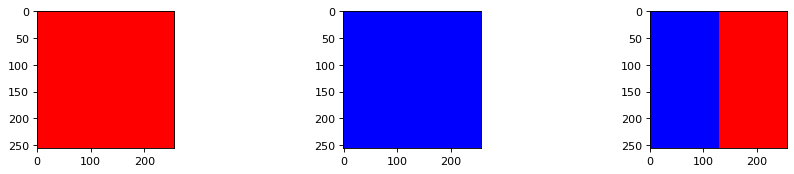

1.jpg                           2.jpg                           3.jpg                           
- red std           255.00      - red std             0.00      - red std           127.50      
- green std           0.00      - green std           0.00      - green std           0.00      
- blue std            0.00      - blue std          255.00      - blue std          127.50      


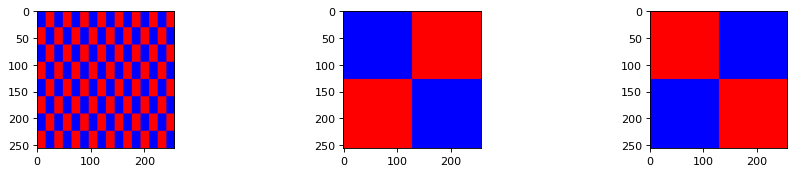

4.jpg                           5.jpg                           6.jpg                           
- red std           127.50      - red std           127.50      - red std           127.50      
- green std           0.00      - green std           0.00      - green std           0.00      
- blue std          127.50      - blue std          127.50      - blue std          127.50      


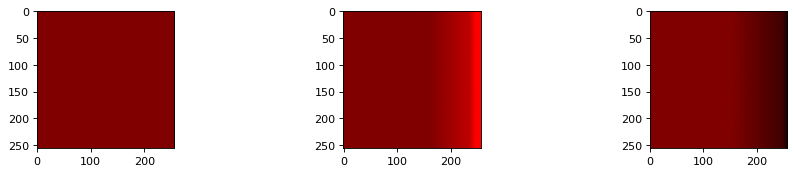

7.jpg                           8.jpg                           9.jpg                           
- red std           128.00      - red std           146.12      - red std           112.66      
- green std           0.00      - green std           0.09      - green std           0.09      
- blue std            0.00      - blue std            0.05      - blue std            0.11      


In [127]:
featuresNames_StdColors = ["red std", "green std", "blue std"]

def featuresExtractor_StdColors(image):
    values = [np.mean(image[:,:,0]),np.mean(image[:,:,1]),np.mean(image[:,:,2])]
    return values
    
e1 = Exercise("images/exercise1/intro/", featuresNames_StdColors, featuresExtractor_StdColors)
e1.display(scale = 1.0)

Questions:   
i) Why are all the feature vectors of the images 1.jpg-2.jpg the same (and equal to zero)?<br>

    Feature vectors <Std red, Std green, Std blue> of 1.jpg and 2.jpg are equal to <120.21, 120.21, 0>.

ii) Why are all the feature vectors of the images 3.jpg-6.jpg the same? <br>

    Feature vectors <Std red, Std green, Std blue> of the images 3.jpg - 6.jpg are the same and are equal to <120.21, 120.21, 127.50>.

1.3) The third color moment is a skeweness.   
The skeweness measures how asymmetric is the distribution (positive value = the right tail of the distribution is longer; negative value = the left tail of the distribution is longer).    
Complete the featuresExtractor_SkewColors method so that it computes and returns a 3-element feature vector containing skeweness of the red, green, and blue color (use skew() + you must transform numpy array to 1-D array; use .ravel() ). Run the script and analyse the results: <br>  
  

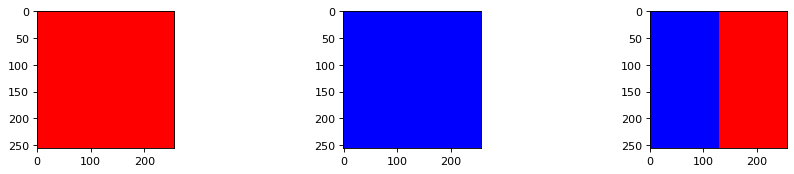

1.jpg                             2.jpg                             3.jpg                             
- red skew             0.00       - red skew             0.00       - red skew             0.00       
- green skew           0.00       - green skew           0.00       - green skew           0.00       
- blue skew            0.00       - blue skew            0.00       - blue skew            0.00       


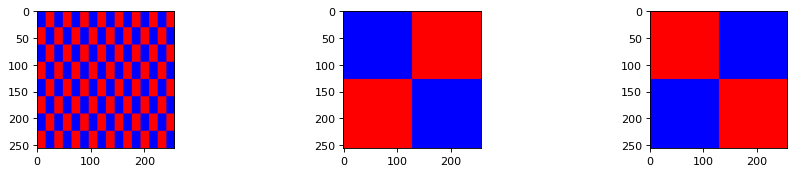

4.jpg                             5.jpg                             6.jpg                             
- red skew             0.00       - red skew             0.00       - red skew             0.00       
- green skew           0.00       - green skew           0.00       - green skew           0.00       
- blue skew            0.00       - blue skew            0.00       - blue skew            0.00       


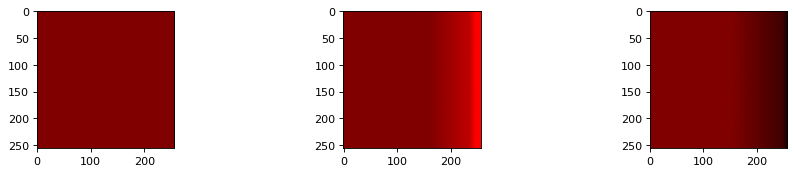

7.jpg                             8.jpg                             9.jpg                             
- red skew             0.00       - red skew             2.06       - red skew            -1.57       
- green skew           0.00       - green skew           3.13       - green skew           2.98       
- blue skew            0.00       - blue skew            4.02       - blue skew            2.62       


In [128]:
featuresNames_SkewColors = ["red skew", "green skew", "blue skew"]

# Compute skewness of the red, green and blue color
def featuresExtractor_SkewColors(image):
    # ravel() transforms numpy array to 1-D array
    values = [skew(image[:,:,0].ravel()), skew(image[:,:,1].ravel()), skew(image[:,:,2].ravel())]
    return values
    
e1 = Exercise("images/exercise1/intro/", featuresNames_SkewColors, featuresExtractor_SkewColors)
e1.display(scale = 1.0)

Questions:   
i) Why are all the feature vectors of images 1.jpg-6.jpg the same (and all the values equal to zero)?<br>

    All feature vectors <Skew red, Skew green, Skew blue> are the same and equal to <0.00, 0.00, 0.00>, because the color is evenly distributed in the picture. 

ii) Why is the skeweness of the distribution of the red color in image 8.jpg positive but in image 9.jpg is negative? <br>

    When value of skewness is a positive one, then it means that the right tail of distribution is longer. In 8.jpg picture, the right side is "redder" and because of it, the right tail is longer. When it is negative, it means that the left tail of distribution is longer. In 9.jpg picture, the left side is "redder", so left tail is longer. 

1.4) Run the below script. This example involves real pictures. Analyse the computed feature vectors (returned by featuresExtractor_MeanColor method). Can you justify the results?<br>

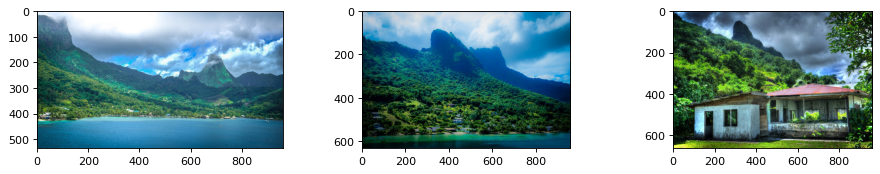

b1_blue.jpg                       b2_blue.jpg                       b3_blue.jpg                       
- red mean            91.29       - red mean            49.16       - red mean            75.92       
- green mean         140.78       - green mean         101.91       - green mean         104.11       
- blue mean          158.17       - blue mean          114.19       - blue mean           86.21       


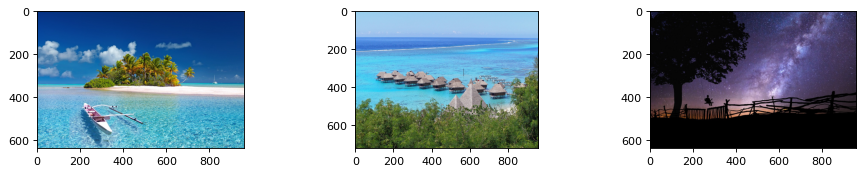

b4_blue.jpg                       b5_blue.jpg                       b6_dark.jpg                       
- red mean            72.89       - red mean           106.24       - red mean            45.40       
- green mean         128.36       - green mean         151.43       - green mean          38.85       
- blue mean          163.10       - blue mean          161.59       - blue mean           57.53       


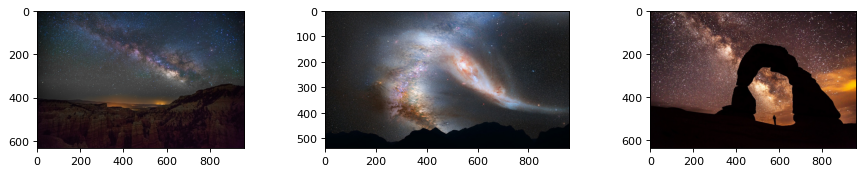

b7_night.jpg                      b8_night.jpg                      b9_night.jpg                      
- red mean            47.57       - red mean            66.40       - red mean            66.72       
- green mean          44.92       - green mean          66.53       - green mean          42.90       
- blue mean           51.92       - blue mean           72.24       - blue mean           37.88       


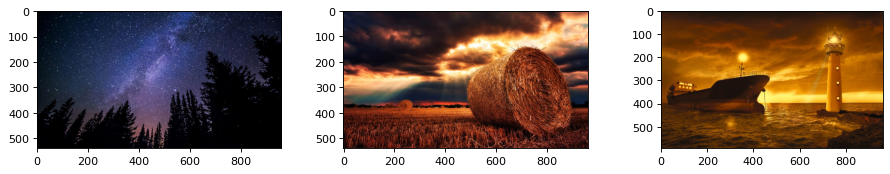

b10_night.jpg                       b11_red.jpg                         b12_red.jpg                         
- red mean             29.84        - red mean            109.32        - red mean            121.54        
- green mean           33.08        - green mean           63.53        - green mean           69.92        
- blue mean            55.91        - blue mean            45.21        - blue mean            12.02        


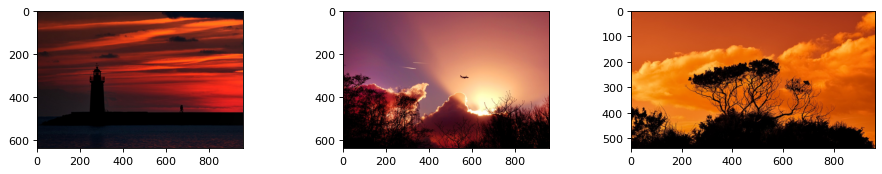

b13_red.jpg                       b14_red.jpg                       b15_red.jpg                       
- red mean            86.68       - red mean           138.77       - red mean           164.93       
- green mean          28.51       - green mean          79.15       - green mean          75.44       
- blue mean           24.68       - blue mean           76.32       - blue mean           17.73       


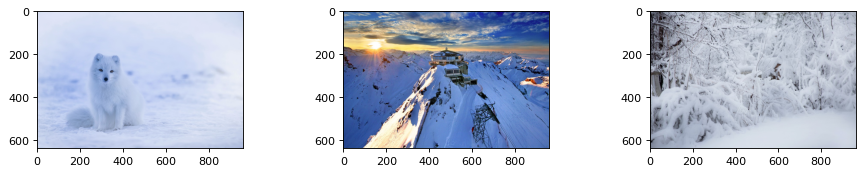

b16_white.jpg                       b17_white.jpg                       b18_white.jpg                       
- red mean            198.58        - red mean            106.62        - red mean            177.67        
- green mean          210.60        - green mean          124.15        - green mean          184.47        
- blue mean           238.11        - blue mean           162.22        - blue mean           197.93        


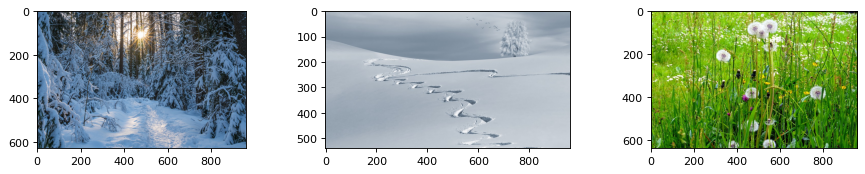

b19_white.jpg                       b20_white.jpg                       b21_green.jpg                       
- red mean             90.34        - red mean            171.43        - red mean            104.59        
- green mean          109.64        - green mean          181.99        - green mean          150.12        
- blue mean           130.00        - blue mean           192.86        - blue mean            39.56        


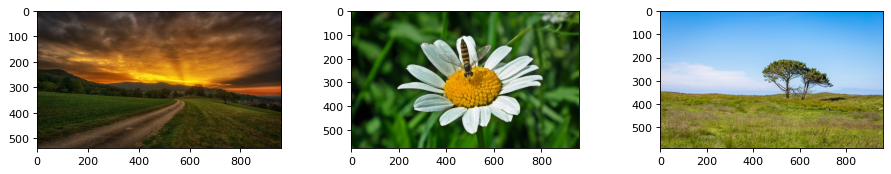

b22_green.jpg                       b23_green.jpg                       b24_green.jpg                       
- red mean             89.22        - red mean             73.10        - red mean            131.89        
- green mean           65.61        - green mean          101.08        - green mean          164.07        
- blue mean            29.21        - blue mean            50.68        - blue mean           157.92        


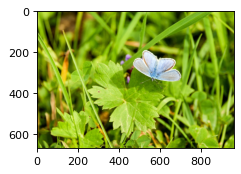

b25_green.jpg                       
- red mean            125.24        
- green mean          153.94        
- blue mean            31.46        


In [129]:
e1 = Exercise("images/exercise1/base/", featuresNames_MeanColors, featuresExtractor_MeanColors)
e1.display(scale = 1.0)

Questions:   
i) Consider the image b1_blue.jpg. Which color has the greatest mean value and which has the lowest? Compare it with the image b3_blue.jpg. Which color is the most dominant one now? Can you justify the difference between these feature vectors by comparing the pictures?<br>

    In the b1_blue.jpg, the greatest mean value has blue color and the lowest mean value has red color. In the image b3_blue.jpg, the greatest mean value has green color and the lowest mean value has red color. Dominant color in b1 is blue and in b3 is green and it can be seen in these pictures. 

ii) Why are the mean values of the feature vector of the image b6_dark.jpg very low, while they are very high for the b16_white.jpg? <br>

    Mean values of the feature vector of the image b6_dark.jpg are very low, because lower values in RGB are closer to black. Mean values of the feature vector of the image b16_white.jpg are higher, because they tend to be "whiter".

iii) Which of these pictures is "the most red" in your opinion? Look only at the pictures. Then, check the mean value of the red color of the chosen picture. Is it the greatest among all pictures?

    The most red is 15th picture. The mean value is equal to 164.93, and it is the greatest one. 

1.5) Now, it is time to build a simple search engine for finding images. Your task is to complete the cosineSimilarity method which measures similarity between the two provided feature vectors. 
* The greater is the returned value, the greater is the similarity. 
* As the name of the method suggests, use a cosine similarity which is the cosine of the angle between the two vectors. You can use the spatial.distance.cosine() method. However, it returns a distance (the smaller value the better), not a similarity (the greater value the better). You have to handle this issue. Then, run the script. <br><br>
  
Firstly, the method searchForImage loads and displays the selected query image (q1_red.jpg), and derives its feature vector (featuresExtractor_MeanColor is used to extract feature vectors). 

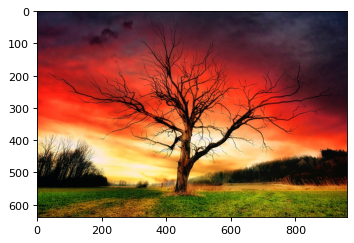

q1_red.jpg
- red mean           137.43       
- green mean          74.65       
- blue mean           48.20       


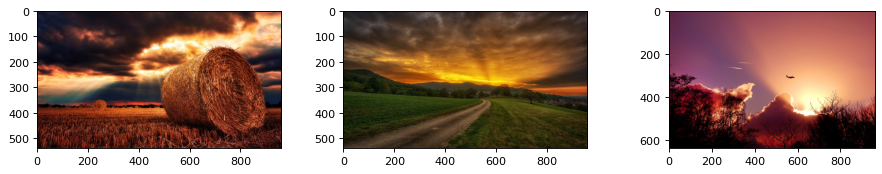

b11_red.jpg                         b22_green.jpg                       b14_red.jpg                         
Similarity              1.00        Similarity              0.99        Similarity              0.99        
- red mean            109.32        - red mean             89.22        - red mean            138.77        
- green mean           63.53        - green mean           65.61        - green mean           79.15        
- blue mean            45.21        - blue mean            29.21        - blue mean            76.32        


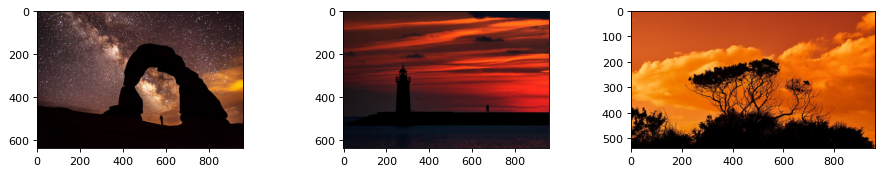

b9_night.jpg                      b13_red.jpg                       b15_red.jpg                       
Similarity             0.99       Similarity             0.98       Similarity             0.98       
- red mean            66.72       - red mean            86.68       - red mean           164.93       
- green mean          42.90       - green mean          28.51       - green mean          75.44       
- blue mean           37.88       - blue mean           24.68       - blue mean           17.73       


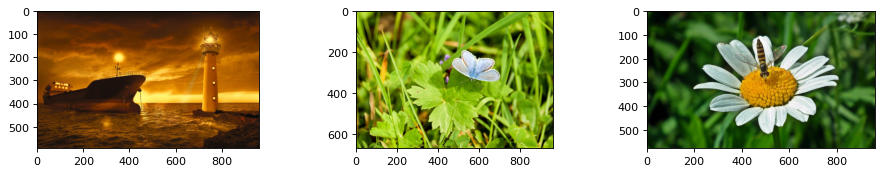

b12_red.jpg                         b25_green.jpg                       b23_green.jpg                       
Similarity              0.98        Similarity              0.92        Similarity              0.91        
- red mean            121.54        - red mean            125.24        - red mean             73.10        
- green mean           69.92        - green mean          153.94        - green mean          101.08        
- blue mean            12.02        - blue mean            31.46        - blue mean            50.68        


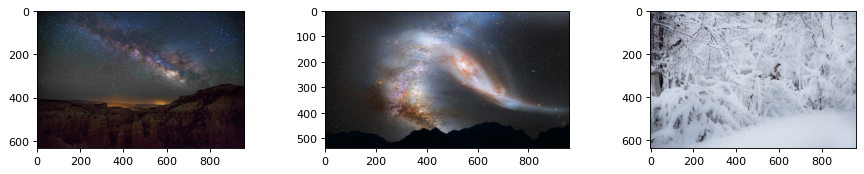

b7_night.jpg                        b8_night.jpg                        b18_white.jpg                       
Similarity              0.91        Similarity              0.91        Similarity              0.90        
- red mean             47.57        - red mean             66.40        - red mean            177.67        
- green mean           44.92        - green mean           66.53        - green mean          184.47        
- blue mean            51.92        - blue mean            72.24        - blue mean           197.93        


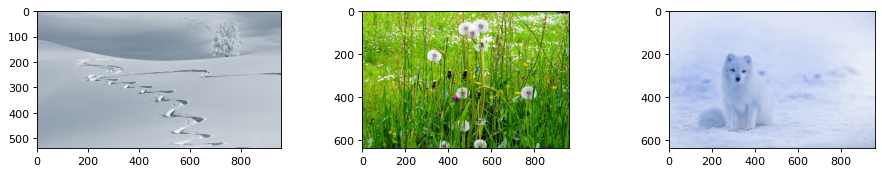

b20_white.jpg                       b21_green.jpg                       b16_white.jpg                       
Similarity              0.90        Similarity              0.90        Similarity              0.89        
- red mean            171.43        - red mean            104.59        - red mean            198.58        
- green mean          181.99        - green mean          150.12        - green mean          210.60        
- blue mean           192.86        - blue mean            39.56        - blue mean           238.11        


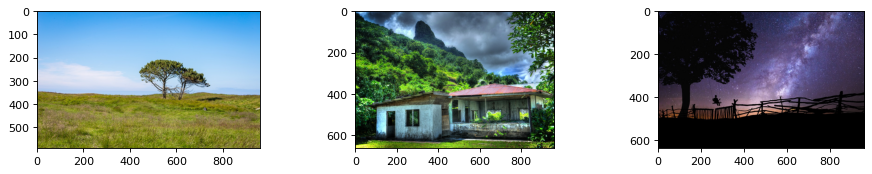

b24_green.jpg                       b3_blue.jpg                         b6_dark.jpg                         
Similarity              0.88        Similarity              0.88        Similarity              0.88        
- red mean            131.89        - red mean             75.92        - red mean             45.40        
- green mean          164.07        - green mean          104.11        - green mean           38.85        
- blue mean           157.92        - blue mean            86.21        - blue mean            57.53        


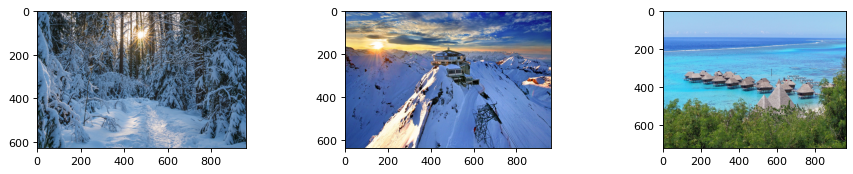

b19_white.jpg                       b17_white.jpg                       b5_blue.jpg                         
Similarity              0.85        Similarity              0.84        Similarity              0.84        
- red mean             90.34        - red mean            106.62        - red mean            106.24        
- green mean          109.64        - green mean          124.15        - green mean          151.43        
- blue mean           130.00        - blue mean           162.22        - blue mean           161.59        


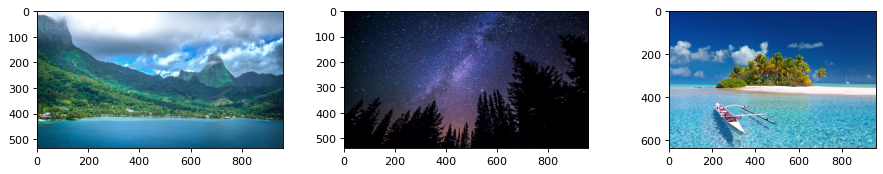

b1_blue.jpg                         b10_night.jpg                       b4_blue.jpg                         
Similarity              0.81        Similarity              0.79        Similarity              0.76        
- red mean             91.29        - red mean             29.84        - red mean             72.89        
- green mean          140.78        - green mean           33.08        - green mean          128.36        
- blue mean           158.17        - blue mean            55.91        - blue mean           163.10        


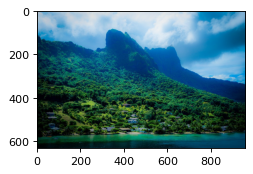

b2_blue.jpg                       
Similarity             0.76       
- red mean            49.16       
- green mean         101.91       
- blue mean          114.19       


In [130]:
# measures similarity between two provided feature vectors
def cosineSimilarity(featuresQuery, featuresImage):
    # the greater value of a (1-distance), the greater is the similarity
    distance = spatial.distance.cosine(featuresQuery, featuresImage)
    return 1 - distance

e1 = Exercise("images/exercise1/base/", featuresNames_MeanColors, featuresExtractor_MeanColors)
# loads and displays selected query image & derives feature vector
e1.searchForImage("images/exercise1/query/", "q1_red.jpg", cosineSimilarity)

#TODO: Images from "exercise1/base" folder are displayed in the order of similarity to the query image. Do you agree with the ranking? Why? Why not? Why is b9_night.jpg ranked better than b15_red.jpg?

Yes
b9_night.jpg is ranked better than b15_red.jpg 

1.6) Search for the most similar images to q2_green.jpg. Verify the results.

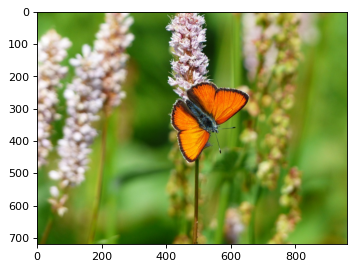

q2_green.jpg
- red mean           127.21       
- green mean         142.08       
- blue mean           64.78       


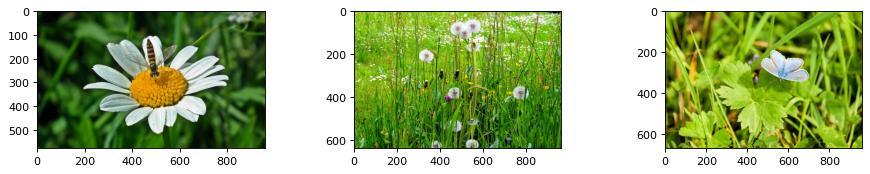

b23_green.jpg                       b21_green.jpg                       b25_green.jpg                       
Similarity              0.99        Similarity              0.99        Similarity              0.98        
- red mean             73.10        - red mean            104.59        - red mean            125.24        
- green mean          101.08        - green mean          150.12        - green mean          153.94        
- blue mean            50.68        - blue mean            39.56        - blue mean            31.46        


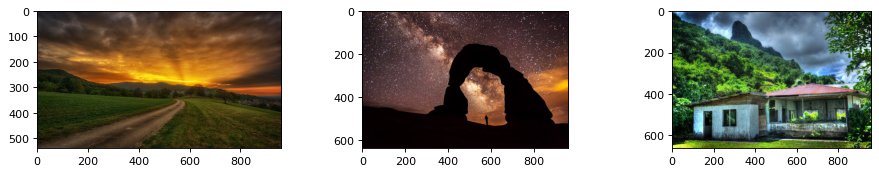

b22_green.jpg                       b9_night.jpg                        b3_blue.jpg                         
Similarity              0.98        Similarity              0.96        Similarity              0.96        
- red mean             89.22        - red mean             66.72        - red mean             75.92        
- green mean           65.61        - green mean           42.90        - green mean          104.11        
- blue mean            29.21        - blue mean            37.88        - blue mean            86.21        


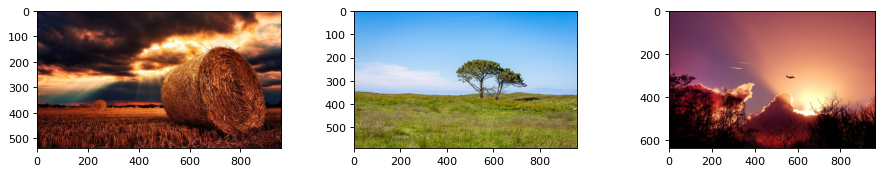

b11_red.jpg                         b24_green.jpg                       b14_red.jpg                         
Similarity              0.96        Similarity              0.95        Similarity              0.95        
- red mean            109.32        - red mean            131.89        - red mean            138.77        
- green mean           63.53        - green mean          164.07        - green mean           79.15        
- blue mean            45.21        - blue mean           157.92        - blue mean            76.32        


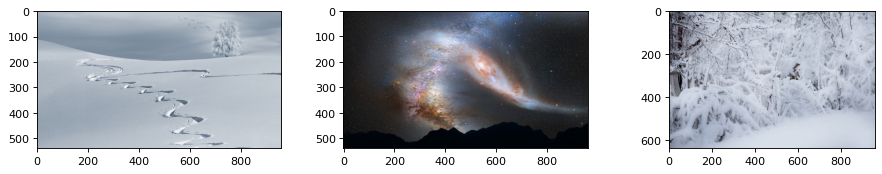

b20_white.jpg                       b8_night.jpg                        b18_white.jpg                       
Similarity              0.95        Similarity              0.95        Similarity              0.95        
- red mean            171.43        - red mean             66.40        - red mean            177.67        
- green mean          181.99        - green mean           66.53        - green mean          184.47        
- blue mean           192.86        - blue mean            72.24        - blue mean           197.93        


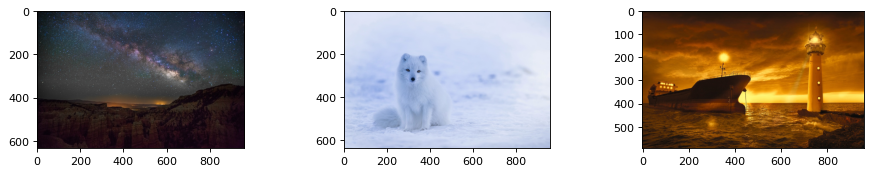

b7_night.jpg                        b16_white.jpg                       b12_red.jpg                         
Similarity              0.94        Similarity              0.94        Similarity              0.92        
- red mean             47.57        - red mean            198.58        - red mean            121.54        
- green mean           44.92        - green mean          210.60        - green mean           69.92        
- blue mean            51.92        - blue mean           238.11        - blue mean            12.02        


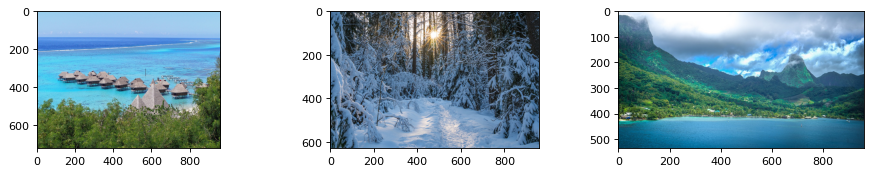

b5_blue.jpg                         b19_white.jpg                       b1_blue.jpg                         
Similarity              0.92        Similarity              0.92        Similarity              0.90        
- red mean            106.24        - red mean             90.34        - red mean             91.29        
- green mean          151.43        - green mean          109.64        - green mean          140.78        
- blue mean           161.59        - blue mean           130.00        - blue mean           158.17        


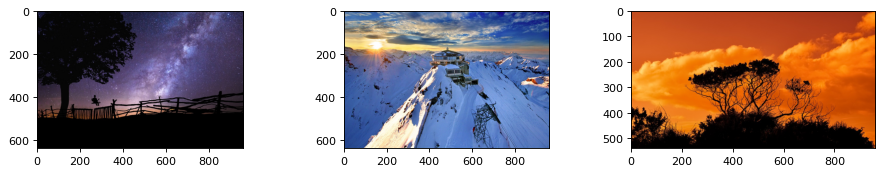

b6_dark.jpg                         b17_white.jpg                       b15_red.jpg                         
Similarity              0.90        Similarity              0.90        Similarity              0.89        
- red mean             45.40        - red mean            106.62        - red mean            164.93        
- green mean           38.85        - green mean          124.15        - green mean           75.44        
- blue mean            57.53        - blue mean           162.22        - blue mean            17.73        


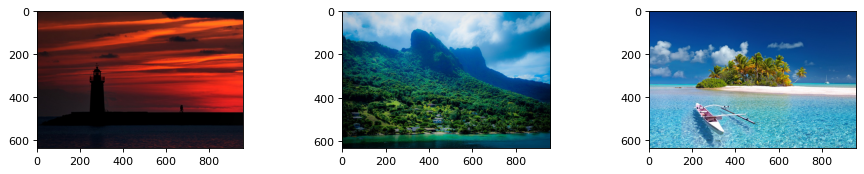

b13_red.jpg                       b2_blue.jpg                       b4_blue.jpg                       
Similarity             0.88       Similarity             0.87       Similarity             0.86       
- red mean            86.68       - red mean            49.16       - red mean            72.89       
- green mean          28.51       - green mean         101.91       - green mean         128.36       
- blue mean           24.68       - blue mean          114.19       - blue mean          163.10       


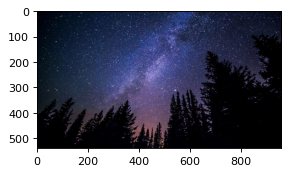

b10_night.jpg                       
Similarity              0.84        
- red mean             29.84        
- green mean           33.08        
- blue mean            55.91        


In [131]:
e1.searchForImage("images/exercise1/query/", "q2_green.jpg", cosineSimilarity)

1.7) Search for the most similar images to q3_blue.jpg. Verify the results.

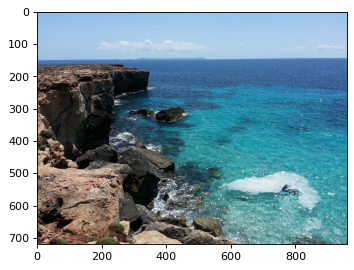

q3_blue.jpg
- red mean            93.09       
- green mean         128.93       
- blue mean          143.78       


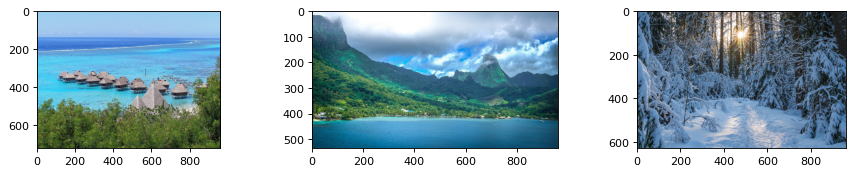

b5_blue.jpg                         b1_blue.jpg                         b19_white.jpg                       
Similarity              1.00        Similarity              1.00        Similarity              1.00        
- red mean            106.24        - red mean             91.29        - red mean             90.34        
- green mean          151.43        - green mean          140.78        - green mean          109.64        
- blue mean           161.59        - blue mean           158.17        - blue mean           130.00        


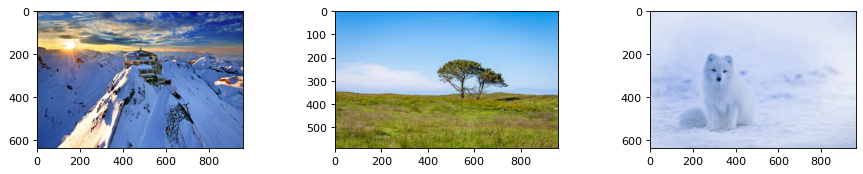

b17_white.jpg                       b24_green.jpg                       b16_white.jpg                       
Similarity              1.00        Similarity              1.00        Similarity              0.99        
- red mean            106.62        - red mean            131.89        - red mean            198.58        
- green mean          124.15        - green mean          164.07        - green mean          210.60        
- blue mean           162.22        - blue mean           157.92        - blue mean           238.11        


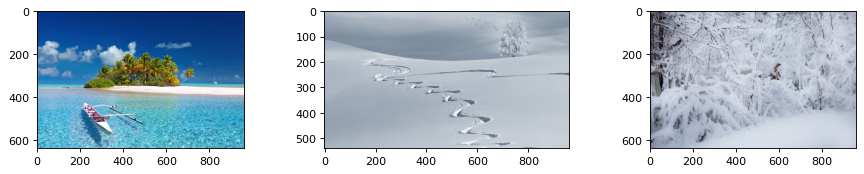

b4_blue.jpg                         b20_white.jpg                       b18_white.jpg                       
Similarity              0.99        Similarity              0.99        Similarity              0.99        
- red mean             72.89        - red mean            171.43        - red mean            177.67        
- green mean          128.36        - green mean          181.99        - green mean          184.47        
- blue mean           163.10        - blue mean           192.86        - blue mean           197.93        


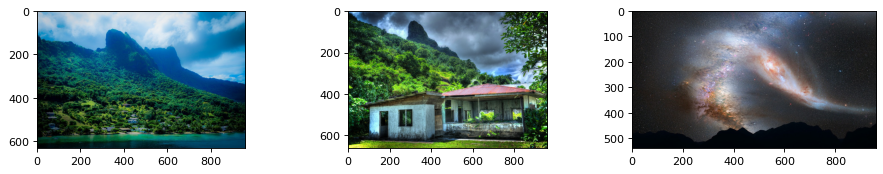

b2_blue.jpg                       b3_blue.jpg                       b8_night.jpg                      
Similarity             0.99       Similarity             0.99       Similarity             0.99       
- red mean            49.16       - red mean            75.92       - red mean            66.40       
- green mean         101.91       - green mean         104.11       - green mean          66.53       
- blue mean          114.19       - blue mean           86.21       - blue mean           72.24       


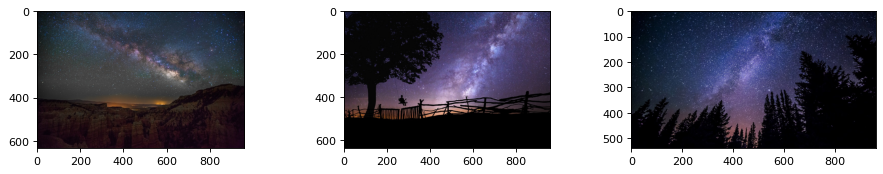

b7_night.jpg                        b6_dark.jpg                         b10_night.jpg                       
Similarity              0.99        Similarity              0.98        Similarity              0.98        
- red mean             47.57        - red mean             45.40        - red mean             29.84        
- green mean           44.92        - green mean           38.85        - green mean           33.08        
- blue mean            51.92        - blue mean            57.53        - blue mean            55.91        


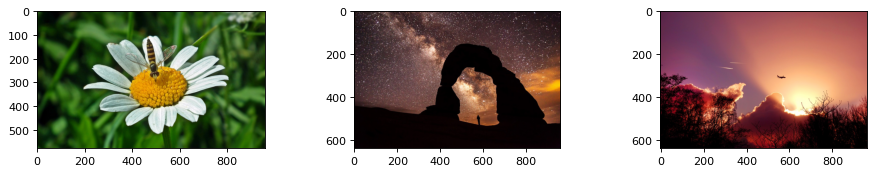

b23_green.jpg                       b9_night.jpg                        b14_red.jpg                         
Similarity              0.94        Similarity              0.91        Similarity              0.90        
- red mean             73.10        - red mean             66.72        - red mean            138.77        
- green mean          101.08        - green mean           42.90        - green mean           79.15        
- blue mean            50.68        - blue mean            37.88        - blue mean            76.32        


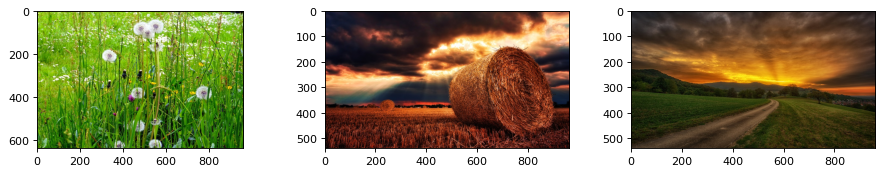

b21_green.jpg                       b11_red.jpg                         b22_green.jpg                       
Similarity              0.87        Similarity              0.86        Similarity              0.85        
- red mean            104.59        - red mean            109.32        - red mean             89.22        
- green mean          150.12        - green mean           63.53        - green mean           65.61        
- blue mean            39.56        - blue mean            45.21        - blue mean            29.21        


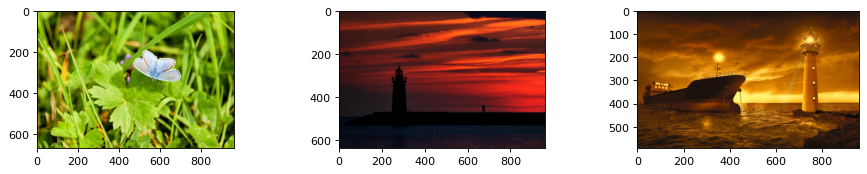

b25_green.jpg                       b13_red.jpg                         b12_red.jpg                         
Similarity              0.84        Similarity              0.75        Similarity              0.73        
- red mean            125.24        - red mean             86.68        - red mean            121.54        
- green mean          153.94        - green mean           28.51        - green mean           69.92        
- blue mean            31.46        - blue mean            24.68        - blue mean            12.02        


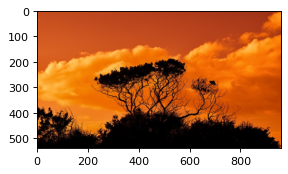

b15_red.jpg                       
Similarity             0.71       
- red mean           164.93       
- green mean          75.44       
- blue mean           17.73       


In [132]:
e1.searchForImage("images/exercise1/query/", "q3_blue.jpg", cosineSimilarity)

1.8) Search for the most similar images to q4_white.jpg. Verify the results.

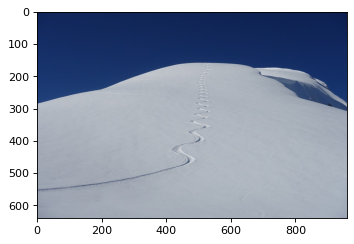

q4_white.jpg
- red mean           120.71       
- green mean         133.53       
- blue mean          157.62       


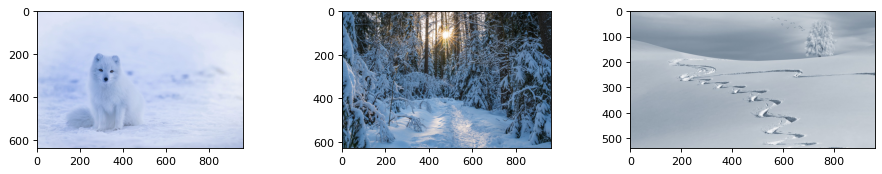

b16_white.jpg                       b19_white.jpg                       b20_white.jpg                       
Similarity              1.00        Similarity              1.00        Similarity              1.00        
- red mean            198.58        - red mean             90.34        - red mean            171.43        
- green mean          210.60        - green mean          109.64        - green mean          181.99        
- blue mean           238.11        - blue mean           130.00        - blue mean           192.86        


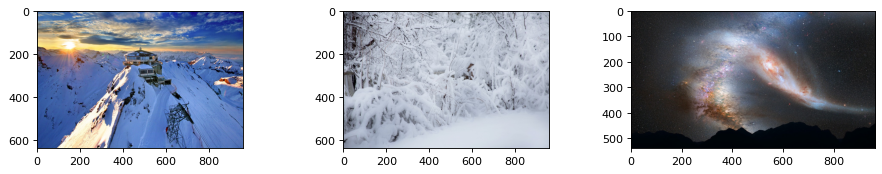

b17_white.jpg                       b18_white.jpg                       b8_night.jpg                        
Similarity              1.00        Similarity              1.00        Similarity              1.00        
- red mean            106.62        - red mean            177.67        - red mean             66.40        
- green mean          124.15        - green mean          184.47        - green mean           66.53        
- blue mean           162.22        - blue mean           197.93        - blue mean            72.24        


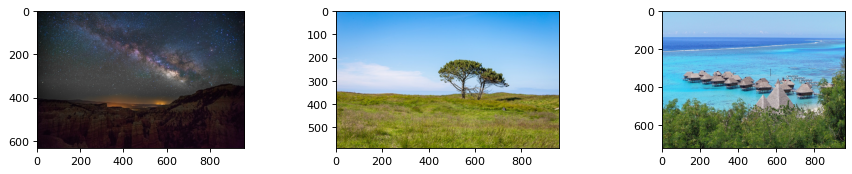

b7_night.jpg                        b24_green.jpg                       b5_blue.jpg                         
Similarity              1.00        Similarity              1.00        Similarity              1.00        
- red mean             47.57        - red mean            131.89        - red mean            106.24        
- green mean           44.92        - green mean          164.07        - green mean          151.43        
- blue mean            51.92        - blue mean           157.92        - blue mean           161.59        


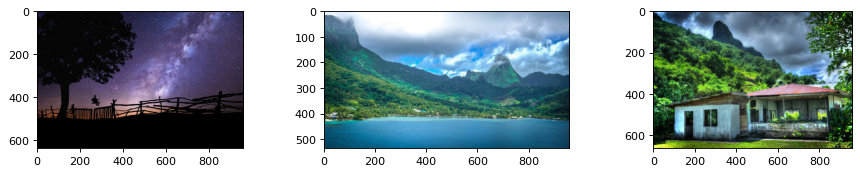

b6_dark.jpg                       b1_blue.jpg                       b3_blue.jpg                       
Similarity             0.99       Similarity             0.99       Similarity             0.99       
- red mean            45.40       - red mean            91.29       - red mean            75.92       
- green mean          38.85       - green mean         140.78       - green mean         104.11       
- blue mean           57.53       - blue mean          158.17       - blue mean           86.21       


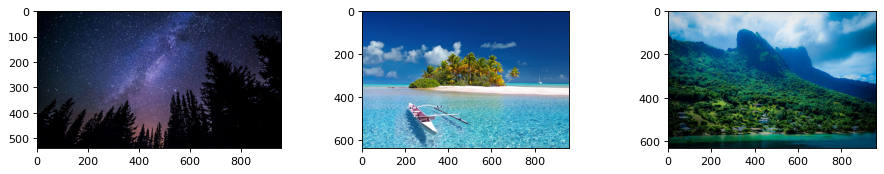

b10_night.jpg                       b4_blue.jpg                         b2_blue.jpg                         
Similarity              0.98        Similarity              0.98        Similarity              0.98        
- red mean             29.84        - red mean             72.89        - red mean             49.16        
- green mean           33.08        - green mean          128.36        - green mean          101.91        
- blue mean            55.91        - blue mean           163.10        - blue mean           114.19        


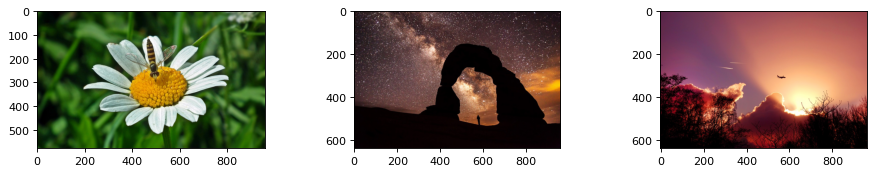

b23_green.jpg                       b9_night.jpg                        b14_red.jpg                         
Similarity              0.94        Similarity              0.94        Similarity              0.93        
- red mean             73.10        - red mean             66.72        - red mean            138.77        
- green mean          101.08        - green mean           42.90        - green mean           79.15        
- blue mean            50.68        - blue mean            37.88        - blue mean            76.32        


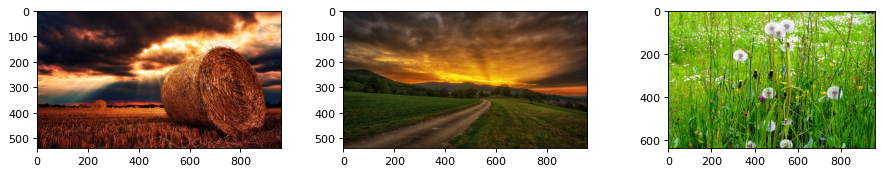

b11_red.jpg                         b22_green.jpg                       b21_green.jpg                       
Similarity              0.90        Similarity              0.88        Similarity              0.87        
- red mean            109.32        - red mean             89.22        - red mean            104.59        
- green mean           63.53        - green mean           65.61        - green mean          150.12        
- blue mean            45.21        - blue mean            29.21        - blue mean            39.56        


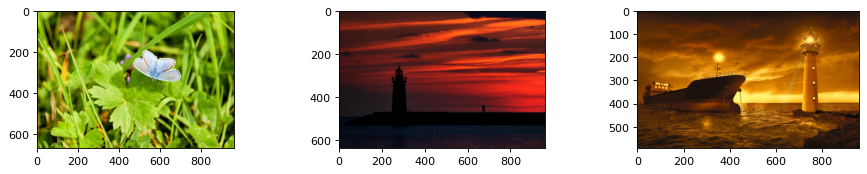

b25_green.jpg                       b13_red.jpg                         b12_red.jpg                         
Similarity              0.85        Similarity              0.80        Similarity              0.77        
- red mean            125.24        - red mean             86.68        - red mean            121.54        
- green mean          153.94        - green mean           28.51        - green mean           69.92        
- blue mean            31.46        - blue mean            24.68        - blue mean            12.02        


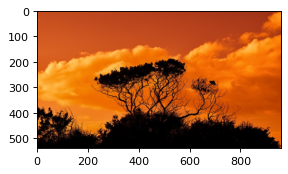

b15_red.jpg                       
Similarity             0.75       
- red mean           164.93       
- green mean          75.44       
- blue mean           17.73       


In [133]:
e1.searchForImage("images/exercise1/query/", "q4_white.jpg", cosineSimilarity)

1.9) Search for the most similar images to q5_dark.jpg. Verify the results.

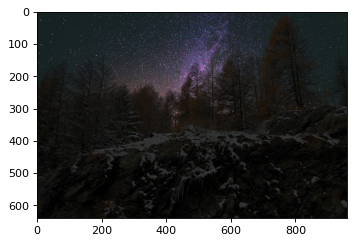

q5_dark.jpg
- red mean            24.89       
- green mean          25.89       
- blue mean           26.53       


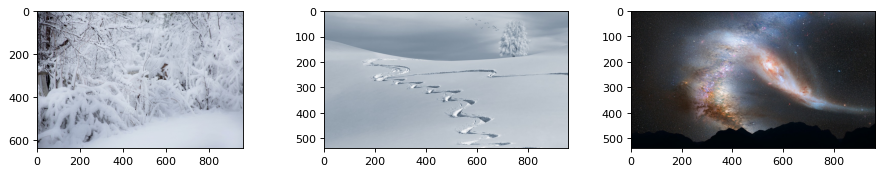

b18_white.jpg                       b20_white.jpg                       b8_night.jpg                        
Similarity              1.00        Similarity              1.00        Similarity              1.00        
- red mean            177.67        - red mean            171.43        - red mean             66.40        
- green mean          184.47        - green mean          181.99        - green mean           66.53        
- blue mean           197.93        - blue mean           192.86        - blue mean            72.24        


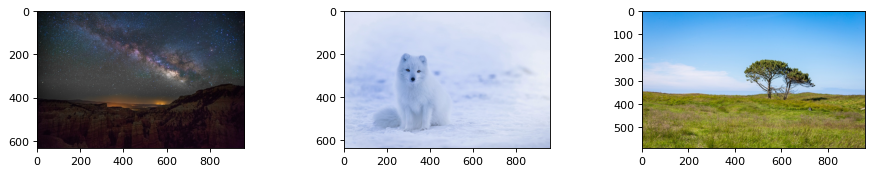

b7_night.jpg                        b16_white.jpg                       b24_green.jpg                       
Similarity              1.00        Similarity              1.00        Similarity              1.00        
- red mean             47.57        - red mean            198.58        - red mean            131.89        
- green mean           44.92        - green mean          210.60        - green mean          164.07        
- blue mean            51.92        - blue mean           238.11        - blue mean           157.92        


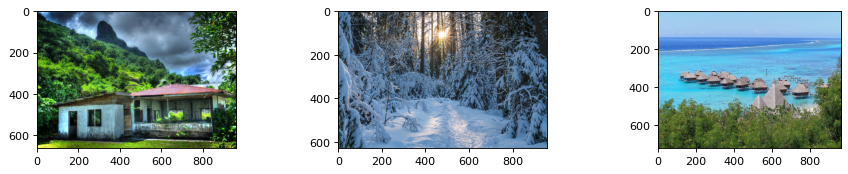

b3_blue.jpg                         b19_white.jpg                       b5_blue.jpg                         
Similarity              0.99        Similarity              0.99        Similarity              0.99        
- red mean             75.92        - red mean             90.34        - red mean            106.24        
- green mean          104.11        - green mean          109.64        - green mean          151.43        
- blue mean            86.21        - blue mean           130.00        - blue mean           161.59        


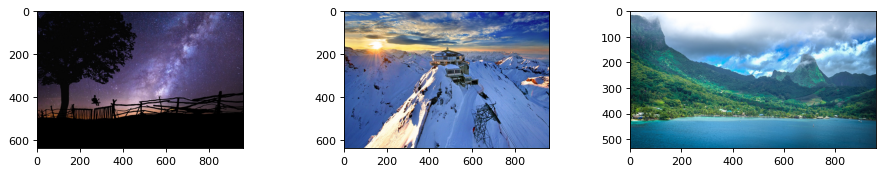

b6_dark.jpg                         b17_white.jpg                       b1_blue.jpg                         
Similarity              0.99        Similarity              0.99        Similarity              0.98        
- red mean             45.40        - red mean            106.62        - red mean             91.29        
- green mean           38.85        - green mean          124.15        - green mean          140.78        
- blue mean            57.53        - blue mean           162.22        - blue mean           158.17        


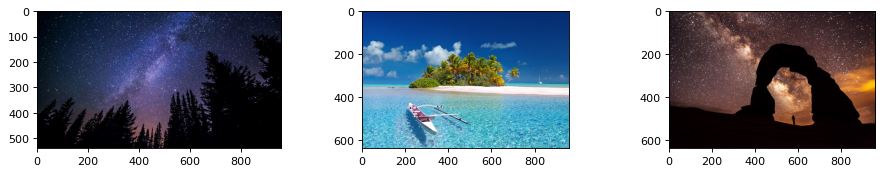

b10_night.jpg                       b4_blue.jpg                         b9_night.jpg                        
Similarity              0.97        Similarity              0.96        Similarity              0.96        
- red mean             29.84        - red mean             72.89        - red mean             66.72        
- green mean           33.08        - green mean          128.36        - green mean           42.90        
- blue mean            55.91        - blue mean           163.10        - blue mean            37.88        


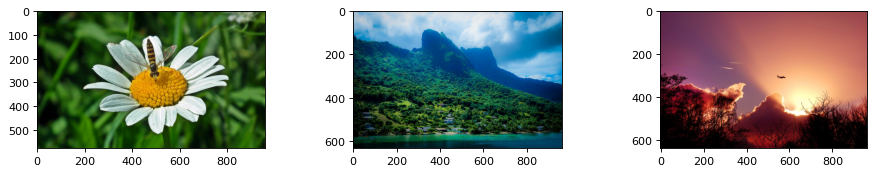

b23_green.jpg                       b2_blue.jpg                         b14_red.jpg                         
Similarity              0.96        Similarity              0.96        Similarity              0.95        
- red mean             73.10        - red mean             49.16        - red mean            138.77        
- green mean          101.08        - green mean          101.91        - green mean           79.15        
- blue mean            50.68        - blue mean           114.19        - blue mean            76.32        


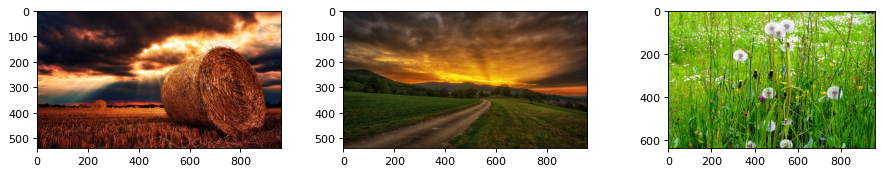

b11_red.jpg                         b22_green.jpg                       b21_green.jpg                       
Similarity              0.93        Similarity              0.92        Similarity              0.90        
- red mean            109.32        - red mean             89.22        - red mean            104.59        
- green mean           63.53        - green mean           65.61        - green mean          150.12        
- blue mean            45.21        - blue mean            29.21        - blue mean            39.56        


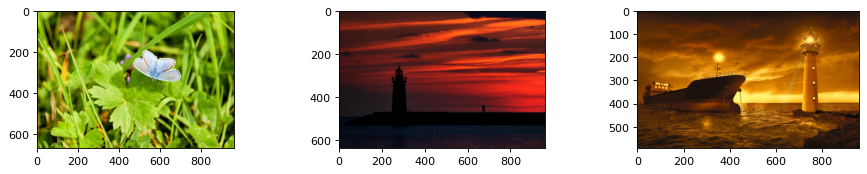

b25_green.jpg                       b13_red.jpg                         b12_red.jpg                         
Similarity              0.88        Similarity              0.84        Similarity              0.82        
- red mean            125.24        - red mean             86.68        - red mean            121.54        
- green mean          153.94        - green mean           28.51        - green mean           69.92        
- blue mean            31.46        - blue mean            24.68        - blue mean            12.02        


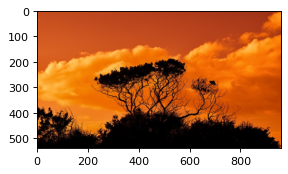

b15_red.jpg                       
Similarity             0.80       
- red mean           164.93       
- green mean          75.44       
- blue mean           17.73       


In [134]:
e1.searchForImage("images/exercise1/query/", "q5_dark.jpg", cosineSimilarity)

#TODO: 1.10) You should find the results for the query image = q5_dark.jpg not satisfactory. What is the reason? <br>

    There are no sharp edges.

Now, use another function of similarity. Use euclidean distance to compute similarity between the two feacture vectors. You can use spatial.distance.euclidean() method but remember that it returns a distance, not a similarity. 

In [135]:

def euclideanSimilarity(featuresQuery, featuresImage):
    distance = spatial.distance.euclidean(featuresQuery, featuresImage)
    return 1 - distance

1.11) Search for the most similar images to q5_dark.jpg using euclideanSimilarity method. Do you find the results much better?

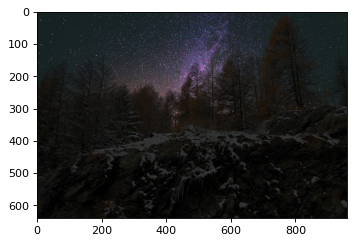

q5_dark.jpg
- red mean            24.89       
- green mean          25.89       
- blue mean           26.53       


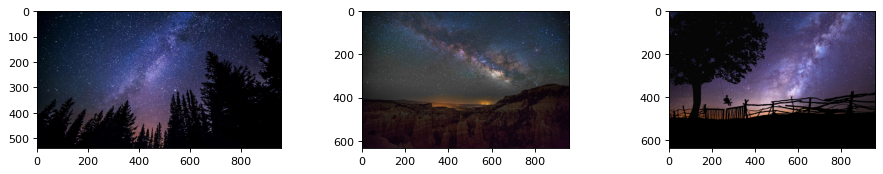

b10_night.jpg                       b7_night.jpg                        b6_dark.jpg                         
Similarity            -29.65        Similarity            -38.01        Similarity            -38.37        
- red mean             29.84        - red mean             47.57        - red mean             45.40        
- green mean           33.08        - green mean           44.92        - green mean           38.85        
- blue mean            55.91        - blue mean            51.92        - blue mean            57.53        


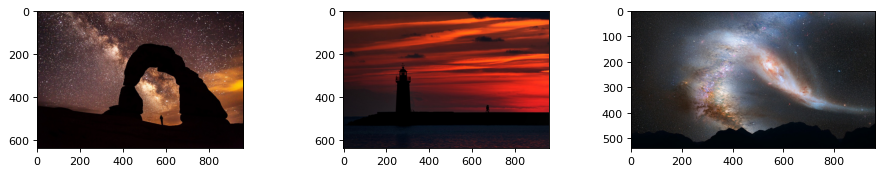

b9_night.jpg                      b13_red.jpg                       b8_night.jpg                      
Similarity           -45.56       Similarity           -60.87       Similarity           -72.92       
- red mean            66.72       - red mean            86.68       - red mean            66.40       
- green mean          42.90       - green mean          28.51       - green mean          66.53       
- blue mean           37.88       - blue mean           24.68       - blue mean           72.24       


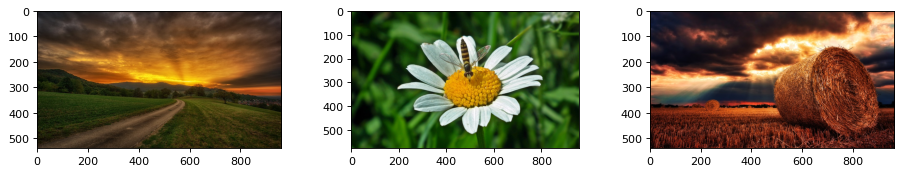

b22_green.jpg                       b23_green.jpg                       b11_red.jpg                         
Similarity            -74.66        Similarity            -91.52        Similarity            -93.31        
- red mean             89.22        - red mean             73.10        - red mean            109.32        
- green mean           65.61        - green mean          101.08        - green mean           63.53        
- blue mean            29.21        - blue mean            50.68        - blue mean            45.21        


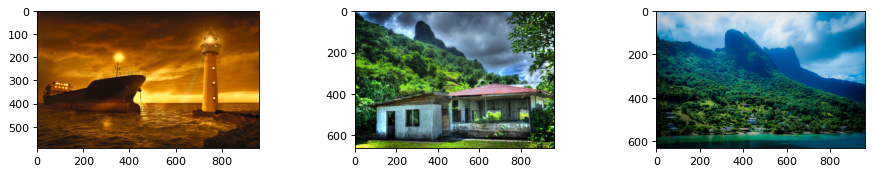

b12_red.jpg                       b3_blue.jpg                       b2_blue.jpg                       
Similarity          -106.20       Similarity          -109.83       Similarity          -117.54       
- red mean           121.54       - red mean            75.92       - red mean            49.16       
- green mean          69.92       - green mean         104.11       - green mean         101.91       
- blue mean           12.02       - blue mean           86.21       - blue mean          114.19       


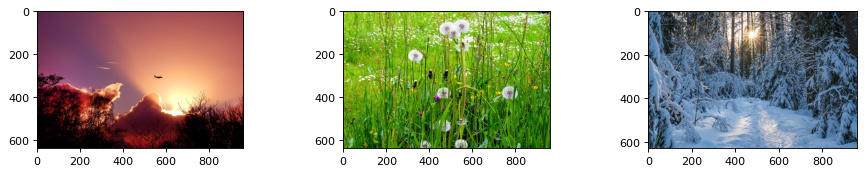

b14_red.jpg                         b21_green.jpg                       b19_white.jpg                       
Similarity           -134.22        Similarity           -147.17        Similarity           -147.34        
- red mean            138.77        - red mean            104.59        - red mean             90.34        
- green mean           79.15        - green mean          150.12        - green mean          109.64        
- blue mean            76.32        - blue mean            39.56        - blue mean           130.00        


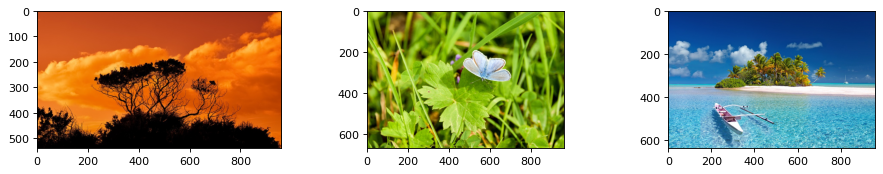

b15_red.jpg                         b25_green.jpg                       b4_blue.jpg                         
Similarity           -147.81        Similarity           -161.77        Similarity           -176.36        
- red mean            164.93        - red mean            125.24        - red mean             72.89        
- green mean           75.44        - green mean          153.94        - green mean          128.36        
- blue mean            17.73        - blue mean            31.46        - blue mean           163.10        


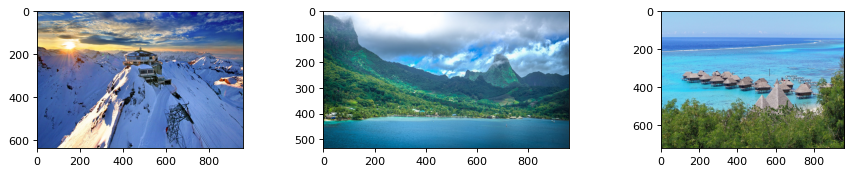

b17_white.jpg                       b1_blue.jpg                         b5_blue.jpg                         
Similarity           -185.40        Similarity           -185.92        Similarity           -200.55        
- red mean            106.62        - red mean             91.29        - red mean            106.24        
- green mean          124.15        - green mean          140.78        - green mean          151.43        
- blue mean           162.22        - blue mean           158.17        - blue mean           161.59        


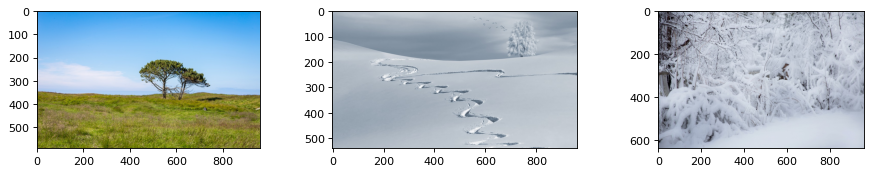

b24_green.jpg                       b20_white.jpg                       b18_white.jpg                       
Similarity           -217.64        Similarity           -270.12        Similarity           -278.04        
- red mean            131.89        - red mean            171.43        - red mean            177.67        
- green mean          164.07        - green mean          181.99        - green mean          184.47        
- blue mean           157.92        - blue mean           192.86        - blue mean           197.93        


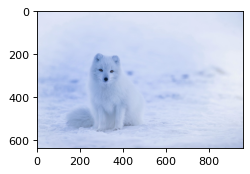

b16_white.jpg                       
Similarity           -329.23        
- red mean            198.58        
- green mean          210.60        
- blue mean           238.11        


In [136]:
e1.searchForImage("images/exercise1/query/", "q5_dark.jpg", euclideanSimilarity)

1.12) Do the same for query image "q4_white.jpg". Why are the results not satisfactory?

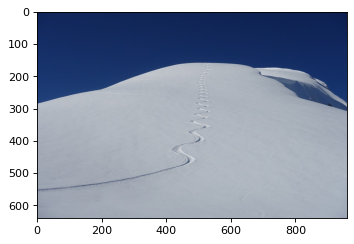

q4_white.jpg
- red mean           120.71       
- green mean         133.53       
- blue mean          157.62       


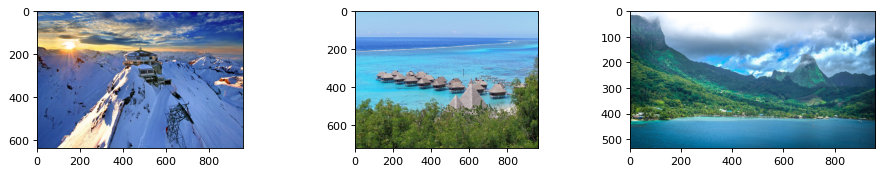

b17_white.jpg                       b5_blue.jpg                         b1_blue.jpg                         
Similarity            -16.55        Similarity            -22.36        Similarity            -29.31        
- red mean            106.62        - red mean            106.24        - red mean             91.29        
- green mean          124.15        - green mean          151.43        - green mean          140.78        
- blue mean           162.22        - blue mean           161.59        - blue mean           158.17        


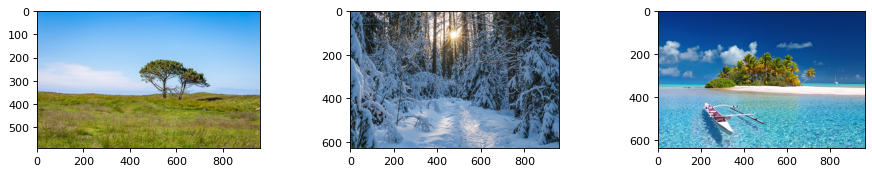

b24_green.jpg                       b19_white.jpg                       b4_blue.jpg                         
Similarity            -31.52        Similarity            -46.50        Similarity            -47.42        
- red mean            131.89        - red mean             90.34        - red mean             72.89        
- green mean          164.07        - green mean          109.64        - green mean          128.36        
- blue mean           157.92        - blue mean           130.00        - blue mean           163.10        


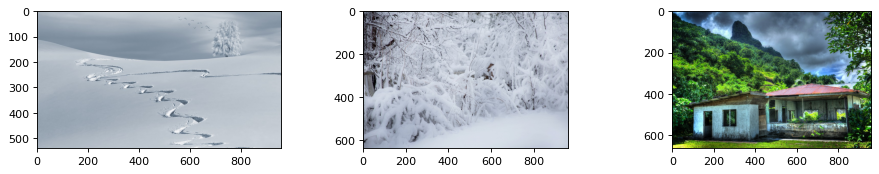

b20_white.jpg                       b18_white.jpg                       b3_blue.jpg                         
Similarity            -77.50        Similarity            -85.39        Similarity            -88.28        
- red mean            171.43        - red mean            177.67        - red mean             75.92        
- green mean          181.99        - green mean          184.47        - green mean          104.11        
- blue mean           192.86        - blue mean           197.93        - blue mean            86.21        


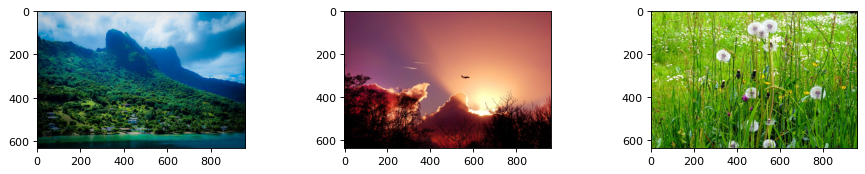

b2_blue.jpg                         b14_red.jpg                         b21_green.jpg                       
Similarity            -88.48        Similarity            -98.46        Similarity           -119.30        
- red mean             49.16        - red mean            138.77        - red mean            104.59        
- green mean          101.91        - green mean           79.15        - green mean          150.12        
- blue mean           114.19        - blue mean            76.32        - blue mean            39.56        


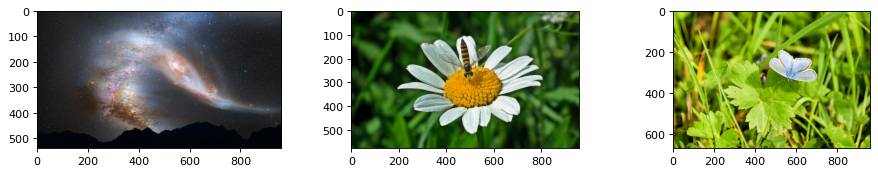

b8_night.jpg                        b23_green.jpg                       b25_green.jpg                       
Similarity           -120.37        Similarity           -120.48        Similarity           -126.88        
- red mean             66.40        - red mean             73.10        - red mean            125.24        
- green mean           66.53        - green mean          101.08        - green mean          153.94        
- blue mean            72.24        - blue mean            50.68        - blue mean            31.46        


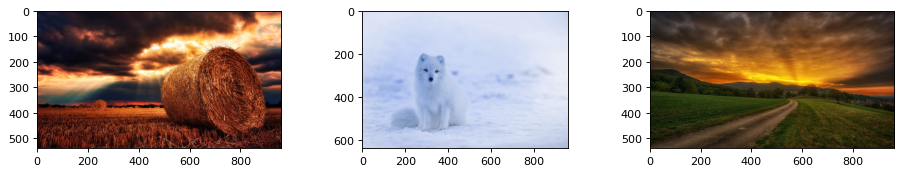

b11_red.jpg                         b16_white.jpg                       b22_green.jpg                       
Similarity           -131.91        Similarity           -134.95        Similarity           -147.64        
- red mean            109.32        - red mean            198.58        - red mean             89.22        
- green mean           63.53        - green mean          210.60        - green mean           65.61        
- blue mean            45.21        - blue mean           238.11        - blue mean            29.21        


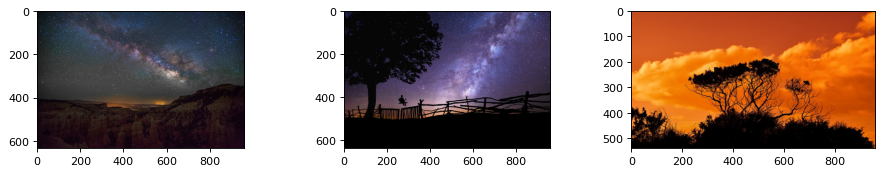

b7_night.jpg                      b6_dark.jpg                       b15_red.jpg                       
Similarity          -155.12       Similarity          -156.02       Similarity          -156.79       
- red mean            47.57       - red mean            45.40       - red mean           164.93       
- green mean          44.92       - green mean          38.85       - green mean          75.44       
- blue mean           51.92       - blue mean           57.53       - blue mean           17.73       


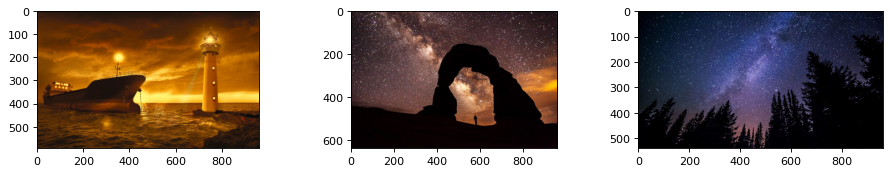

b12_red.jpg                         b9_night.jpg                        b10_night.jpg                       
Similarity           -157.90        Similarity           -158.58        Similarity           -168.39        
- red mean            121.54        - red mean             66.72        - red mean             29.84        
- green mean           69.92        - green mean           42.90        - green mean           33.08        
- blue mean            12.02        - blue mean            37.88        - blue mean            55.91        


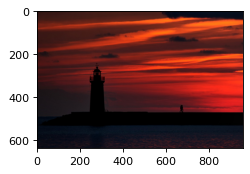

b13_red.jpg                       
Similarity          -171.80       
- red mean            86.68       
- green mean          28.51       
- blue mean           24.68       


In [137]:
e1.searchForImage("images/exercise1/query/", "q4_white.jpg", euclideanSimilarity)

# Exercise 2: Shapes + Centroid + Moment Invariants + Hu Moments

2.1) In Exercise 1 you have derived image properties based on its color.    
- Apart from the color, one may analyse a shape of an object (objects) contained in the picture.   
- The measures which account for this are called image moments.   
- Via image moments one may derive, e.g, an area, a total intensity, or a centroid of an object.   
- However, it is important to remember that a segmentation of the image must be performed first in order to extract objects from the image.  
<br><br>

In this exercise you are asked to compute centroids of the red, green, and blue color components.  
Use center_of_mass() method.   
It returns a pair of values [row - y coordinate, column - x coordinate] for a given matrix. Run the script and analyse the results: <br>  


In [154]:
#centroid
featuresNames_CentroidColors = ["red x", "red y",
                 "green x", "green y",
                 "blue x", "blue y"]

def featuresExtractor_CentroidColors(image):

   # compute centroids of the red, green and blue color components
   cm_red = center_of_mass(image[:,:,0])    # [row - y coordinate, column - x coordinate]
   cm_green = center_of_mass(image[:,:,1])
   cm_blue = center_of_mass(image[:,:,2])
   
   values = [cm_red,cm_green,cm_blue]
   for v in values:
      
      if v[0] == nan:
         v[0] = 0
      if v[1] == nan:
         v[1] = 0
   #values = [cm_red[0],cm_red[1],cm_green[0],cm_green[1],cm_blue[0],cm_blue[1]]
   print(values)
   return values
    
e2 = Exercise("images/exercise1/intro/", featuresNames_CentroidColors, featuresExtractor_CentroidColors)
#e2.display(scale = 1.0)

[(127.5, 127.5), (nan, nan), (nan, nan)]
[(nan, nan), (nan, nan), (127.5, 127.5)]
[(127.5, 191.5), (nan, nan), (127.5, 63.5)]
[(127.5, 127.5), (nan, nan), (127.5, 127.5)]
[(127.5, 127.5), (nan, nan), (127.5, 127.5)]
[(127.5, 127.5), (nan, nan), (127.5, 127.5)]
[(127.5, 127.5), (nan, nan), (nan, nan)]
[(127.50040664177386, 139.93213061074795), (126.53263937896965, 210.14467184191955), (128.5072094995759, 197.735368956743)]
[(127.50063995254193, 114.64197181229142), (127.69452353039692, 204.96432758331937), (127.46132634771818, 205.96236040259203)]


C:\Users\kasia\AppData\Roaming\Python\Python37\site-packages\scipy\ndimage\measurements.py:1407: RuntimeWarning: invalid value encountered in double_scalars
  for dir in range(input.ndim)]


Questions:   
i) What is the difference between the centroid of the red color and the centroid of the blue color for image 3.jpg?<br>

    Red: (127.5, 191.5), Blue: (127.5, 63.5)


ii) Why are the centroids of the red and the blue color the same for images 4.jpg-6.jpg? <br>  
iii) Considering images 7.jpg-9.jpg, why is "red x" the greatest for the image 8.jpg and is the smallest for the image 9.jpg?  

2.2) Some properties of the image (object) which may be found via image moments are called invariants. Moment invariants are properties of the object which do not change with respect to some specific tranformations, e.g., a translation, a scale, or a rotation. Execute the below code. All of the displayed pictures contain the same object. Yet, the difference is that location, size, and orientation of this object is different from one picture to another.

In [ ]:
scale = 1.0
figure(figsize=(9.0 * scale, 4.0 * scale), dpi=80)
subplot(2, 2, 1); plt.imshow(io.imread("exercise2/base/hu1.jpg")) 
subplot(2, 2, 2); plt.imshow(io.imread("exercise2/base/hu2.jpg")) 
subplot(2, 2, 3); plt.imshow(io.imread("exercise2/base/hu3.jpg")) 
subplot(2, 2, 4); plt.imshow(io.imread("exercise2/base/hu4.jpg")) 
plt.show()

2.2) Hu moments is a vector of 7 values which are invariant (as a vector) with respect to translation, scale, and rotation. It means that Hu moments derived from the above images should be the same. In this Exercise you are asked to complete featuresExtractor_Hu method which has to return Hu moments for a given input image. As you may notice, this image is firstly converted to the grayscale and, later, the computed Hu moments are normalised (lambda function). To compute Hu Moments (hu = [ ]) you have to, step by step:<br>
1) Compute raw moments (method moments())<br>
2) Compute central moments (method moments_central())<br>
3) Compute normalized moments (method moments_normalised())<br>
4) Compute Hu moments (method moments_hu())<br>
See the documentation of the scikit package (module measure) for a detailed information about how to use the above methods.

In [ ]:
norm = lambda x: -np.sign(x)*np.log10(np.abs(x))

featuresNames_Hu = ["hu1", "hu2", "hu3","hu4", "hu5", "hu6","hu7"]

# TODO
#def featuresExtractor_Hu(image):
#    img = rgb2gray(image)
#    hu = []
#    l = [norm(f) for f in hu]
#    return l
    
e2 = Exercise("exercise2/base/", featuresNames_Hu, featuresExtractor_Hu)

2.3) Search for the most similar images to q1.jpg. Verify the results (you can use the cosineSimilarity method). Why are some of the computed Hu moments different from one image to another (these images which contain the same object), while they should not?

In [ ]:
e2.searchForImage("exercise2/query/", "q1.jpg", cosineSimilarity)

2.4) Repeat the previous task for query = q2.jpg.

In [ ]:
e2.searchForImage("exercise2/query/", "q2.jpg", cosineSimilarity)

# Exercise 3: Texture + Gabor's Filter

3.1) Apart from the color and the shape, a texture is an important characteristic of an object/image. Run the below code. In this Exercise you are asked to implement simple search engine based on Gabor's filter. Gabor's filter is a linear filter used for texture analysis. It can be applied to an image to detect specyfic frequency content (pattern). This involves different frequencies as well as the sizes of this content. Gabor's filter is a Gaussian kernel function modulated by a sinusoidal wave. Look at the below figures. They illustrate several Gabor's filters which are different with repect to the orientation (angle) and the frequency. You may change the values of angles and freqs arrays and run the script again to see the results. However, restore their original values for the remainder of this exercise. 

In [ ]:
std = 10.0

#angles = [0, 30, 60, 90]
#freqs = [0.03, 0.05, 0.07, 0.09]
angles = [0, 30, 60, 90]
freqs = [0.03, 0.05, 0.07, 0.09]

scale = 1.0
kernels = []

for angle in angles:
    kernels_row = []
    figure(figsize=(14.0 * scale, 4.0 * scale), dpi=80)
    num = 0
    for freq in freqs:
        num += 1
        kernel = np.real(gabor_kernel(freq, theta=angle / 90.0 * 0.5 * np.pi, sigma_x=std, sigma_y=std))
        kernels_row.append(kernel)
        subplot(1, 4, num); plt.imshow(kernel, cmap='jet', vmin=-0.002, vmax=0.002) 
        plt.colorbar(orientation='horizontal', ticks = [-0.002, 0.0, 0.002])
    kernels.append(kernels_row)
plt.show()

3.2) The above filters (kernels) are convolved with the original picture. The obtained results of the convolution are images which represents frequency contant (size, orientation, frequency) which appears in the original image. Run the below script (ignore the last image):<br><br>
i) The image b1.jpg illustrates a zebra. Do you see the pattern? <br> 
ii) The below pictures are the results of the convolution. Compare them with the previously (above) illustrated Gabor's filters (kernels). Why is the outcome of the convolution the most visible for the kernels with the lowest frequencies (0.03, 0.05) and for the kernels with the lowest angles (0.0, 30.0)? <br> 
iii) Change b1.jpg to b10.jpg. Why is the outcome equally visible for all of the considered angles? <br>

There are many ways to incorporate Gabor's filters to image recognition. Usually, feature vectors are derived directly from the outomes of the convolution and the machine learning is involved to build a prediction model. In this exercise, you are asked to use a very simple apporach rather than the machine learning. Your task is to aggregate the outcomes of the convolution in order to generate a single image which represents frequency content detected in the original image. For that purpose, complete the three TODOs in the below code such that an averaged outcome of the img_convolve outcomes is generated. Run the script again and the the results (last image).

In [ ]:
image = rgb2gray(io.imread("exercise3/base/b1.jpg"))
io.imshow(image)

# TODO: init sum_image with zeros (np. zero). The matrix must be of a proper size (image.shape)
# sum_image = []

for row in kernels:
    figure(figsize=(14.0 * scale, 4.0 * scale), dpi=80)
    num = 0
    for kernel in row:
        num += 1
        img_convolve = fftconvolve(image, kernel, mode='same')  
    
        # TODO
        # add img_convovle to sum_image
        # sum_image = 
        
        subplot(1, 4, num); plt.imshow(img_convolve, cmap='jet', vmin=0.0, vmax=0.5) 
        plt.colorbar(orientation='horizontal', ticks=[0.0, 0.5])
        
# TODO compute the averaged values (divide sum_image by the number of kernels = 16)
averaged_image = [[1]]

plt.show()
figure(figsize=(4.0 * scale, 4.0 * scale), dpi=80)
subplot(1, 1, 1); plt.imshow(averaged_image, cmap='jet', vmin=0.0, vmax=0.5) 
plt.colorbar(orientation='horizontal', ticks=[0.0, 0.25, 0.5])
plt.show()

3.3) Complete the applyGaborsFilters method such that it returns an averaged image (outcomes of convolution; you can just copy the code you finished in the previous step).

In [ ]:
# TODO
#def applyGaborsFilters(image):
#    return []

3.4) Run the below script and analyse the results of applyGaborsFilters() method for different images. Consider the images with the stripes and these without the stripes (grain). These are the two textures which are considered in this exercise. What measure (mean, std, e.t.) may give different results for these two textures and may be used as a measure of similarity?

In [ ]:
def displayGabors():
    scale = 1.0
    collection1 = io.imread_collection("exercise3/base/*.jpg") 
    collection2 = io.imread_collection("exercise3/query/*.jpg")  
    images1 = [collection1[i] for i in range(0, len(collection1))]
    images2 = [collection2[i] for i in range(0, len(collection2))]
    images = images1 + images2
    for image in images:
        figure(figsize=(10.0 * scale, 5.0 * scale), dpi=80)
        gabor_image = applyGaborsFilters(image)
        subplot(1, 2, 1); plt.imshow(image) 
        subplot(1, 2, 2); plt.imshow(gabor_image, cmap='jet', vmin=0.0, vmax=0.5)
        plt.show()
displayGabors()

3.5) In this exercise you are asked to make a simple search engine for finding images based on the texture. For this purpose:<br><br>
i) Complete the featuresExtractor_Texture method. Firstly, it should use applyGaborsFilters method to generate an anverge outcome of the convolution for 16 Gabor's filters which were previously generated. Then, the method should return a feature vector consisting of the mean, the standard deviation, the skeweness, and the kurtosis of values of the generated image. The kurtosis is a fourth color moment and it measures how flat (or tall) the distribution is in comparison to normal distribution.   <br>
ii) Complete the weightedSumSimilarity method. It should compute a weighted sum of the absolute values of the differences between the values of the subsequent characteristics (features). Remember that the smaller is that sum the greater is the similarity but the method expects that with the greater similarity the greater is the outcome.  <br>
<br>
Run the below four scripts and analyse the results. Do you find them satisfactory? Which feature accounts for measuring similarity the most? Try to manipulate the weights in order to improve the results.

In [ ]:
featuresNames_Texture = ["Mean", "Std", "Skew","Kurt"]

# TODO
#def featuresExtractor_Texture(image):
#   img = applyGaborsFilters(image)
#   return [1]

# TODO 
#def weightedSumSimilarity(featuresQuery, featuresImage):
#    w = [1.0, 1.0, 1.0, 1.0]
#    score = 0.0
#    return score

e3 = Exercise("exercise3/base/", featuresNames_Texture, featuresExtractor_Texture)

In [ ]:
e3.searchForImage("exercise3/query/", "q1.jpg", weightedSumSimilarity)

In [ ]:
e3.searchForImage("exercise3/query/", "q2.jpg", weightedSumSimilarity)

In [ ]:
e3.searchForImage("exercise3/query/", "q3.jpg", weightedSumSimilarity)

In [ ]:
e3.searchForImage("exercise3/query/", "q4.jpg", weightedSumSimilarity)